In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1437, done.
remote: Counting objects: 100% (210/210), done.
remote: Compressing objects: 100% (144/144), done.
remote: Total 1437 (delta 142), reused 127 (delta 65), pack-reused 1227
Receiving objects: 100% (1437/1437), 60.23 MiB | 16.57 MiB/s, done.
Resolving deltas: 100% (1026/1026), done.


In [ ]:
import torch
torch.backends.cudnn.benchmark = True

In [ ]:
from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesIntercept import make_lm_program_ig_intercept, make_lm_program_ig_intercept_batched

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.Transformer_CNF import TransformerCNFConditionalDecoder
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist

from PFNExperiments.Training.FlowMatching.CFMLossOT2 import CFMLossOT2

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.Training.FlowMatching.Couplings import MiniBatchOTCoupling

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import make_simulate_X_by_loading
from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform_discretized3

In [ ]:
N = 50
P = 5
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_intercept_tabpfn_v1"

#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0
tau_beta0 = 3.0

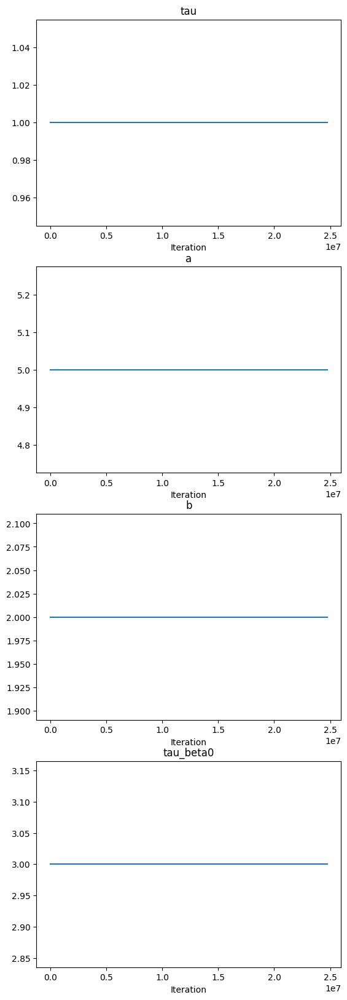

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("tau_beta0", curriculum.constant_scheduler(tau_beta0)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
with open("/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_1_000_000.pt", "rb") as f:
  X_tabpfn = torch.load(f)

X_tabpfn[torch.isnan(X_tabpfn)] = 0

#mins = torch.min(X_tabpfn, dim=1)[0]
#maxs = torch.max(X_tabpfn, dim=1)[0]
#X_tabpfn = (X_tabpfn - mins.unsqueeze(1)) / ((maxs - mins) + 1e-5).unsqueeze(1)

# delte inf
X_tabpfn[torch.isinf(X_tabpfn)] = 0

generate_X_tabpfn = make_simulate_X_by_loading(X_tabpfn)

In [ ]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0}

In [ ]:
?GenerateDataCurriculumCFM

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_intercept_batched,
    curriculum= curriculum,
    pprogram_covariates = generate_X_tabpfn,

)

In [ ]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic()[0])).keys()

AssertionError: X.shape = torch.Size([10000, 50, 5]), expected shape = (10000, 100, 5)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 12.27it/s]


{'X': {'mean': tensor(0.4962), 'variance': tensor(0.0726), 'min': tensor(0.), 'max': tensor(1.)}, 'y': {'mean': tensor(0.0337), 'variance': tensor(10.8689), 'min': tensor(-13.0297), 'max': tensor(12.4742)}, 'beta': {'mean': tensor([ 0.0321, -0.0137,  0.0017, -0.0329,  0.0152,  0.0310]), 'variance': tensor([8.8939, 0.9991, 1.0655, 1.0098, 0.9977, 1.0386]), 'min': tensor([-9.3898, -3.2065, -4.1424, -3.5956, -3.3493, -3.2896]), 'max': tensor([9.0342, 3.2358, 3.6786, 3.3350, 3.4849, 4.0583])}}
Statistics for sigma_squared:
Mean: tensor([0.4941])
Variance: tensor([0.0802])
Min: tensor([0.1359])
Max: tensor([2.9457])


Statistics for beta0:
Mean: tensor([0.0321])
Variance: tensor([8.8939])
Min: tensor([-9.3898])
Max: tensor([9.0342])


Statistics for time:
Mean: 0.5006264231866225
Variance: 0.0828795023809328
Min: 0.0012964606285095215
Max: 0.9990432262420654


Statistics for base_sample_beta:
Mean: tensor([-0.0226, -0.0030,  0.0093, -0.0308, -0.0132, -0.0039])
Variance: tensor([1.0311, 0.97

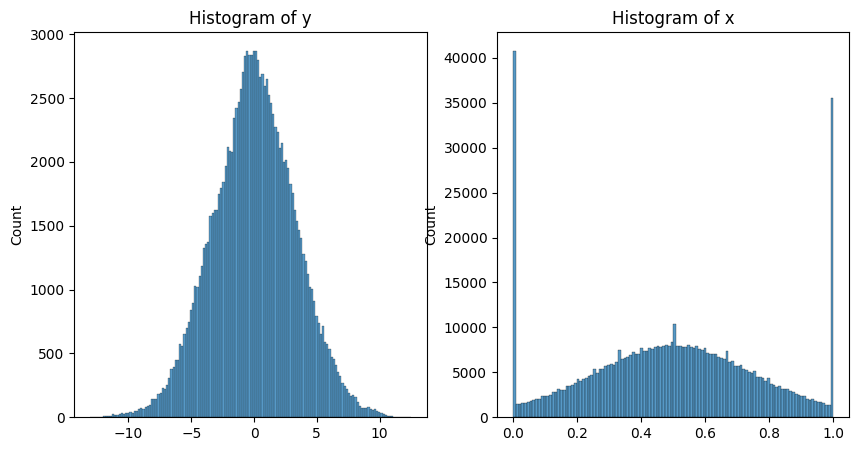

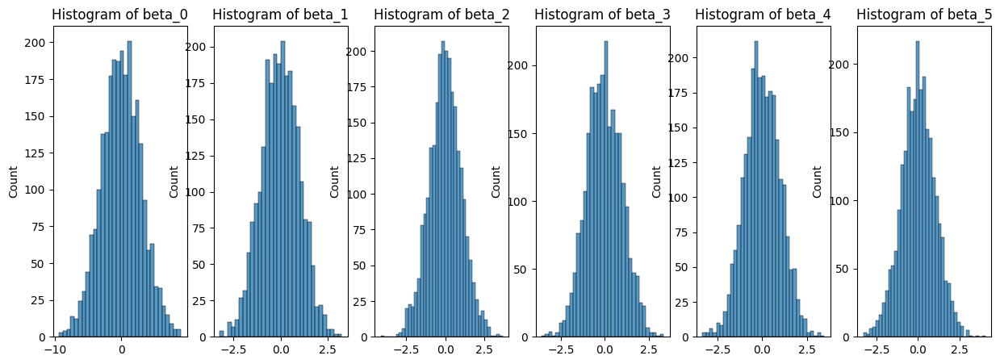

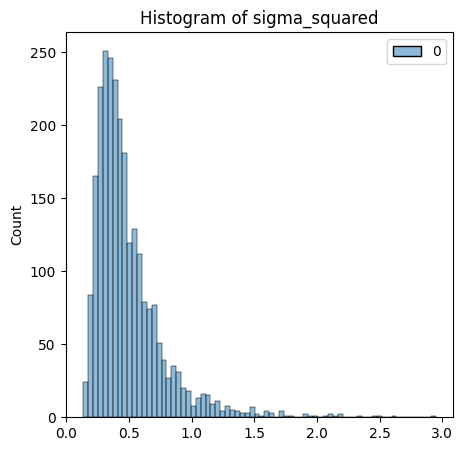

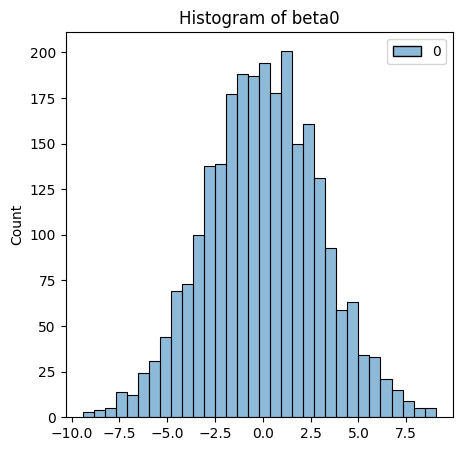

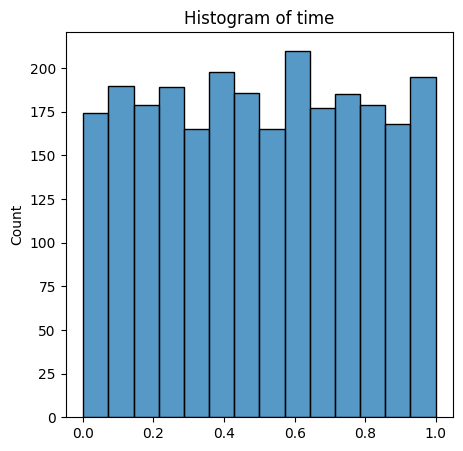

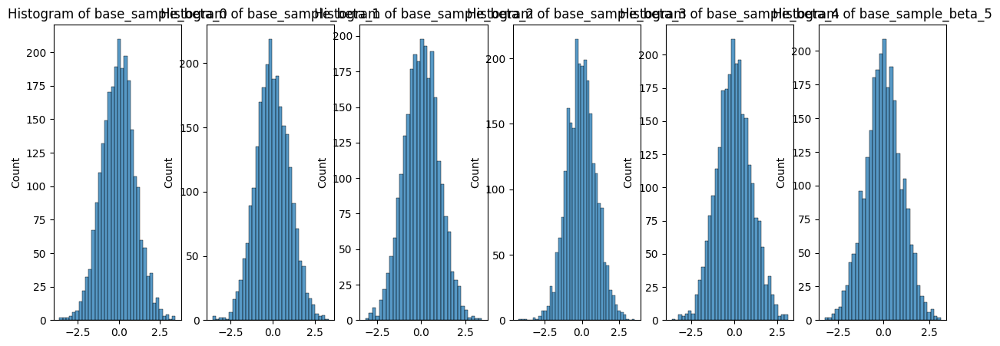

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 103.99it/s]

{'X': {'mean': tensor(0.4981), 'variance': tensor(0.0721), 'min': tensor(0.), 'max': tensor(1.)}, 'y': {'mean': tensor(0.0141), 'variance': tensor(10.8514), 'min': tensor(-13.1199), 'max': tensor(12.7665)}, 'beta': {'mean': tensor([-0.0142,  0.0104, -0.0009,  0.0088,  0.0095,  0.0178]), 'variance': tensor([8.9174, 1.0193, 1.0192, 0.9983, 1.0391, 1.0035]), 'min': tensor([-10.3073,  -3.4667,  -3.9566,  -4.1528,  -3.0651,  -3.6661]), 'max': tensor([11.1584,  3.2389,  3.4296,  4.7478,  3.3385,  3.5979])}}
Statistics for sigma_squared:
Mean: tensor([0.4974])
Variance: tensor([0.0830])
Min: tensor([0.1275])
Max: tensor([3.3689])


Statistics for beta0:
Mean: tensor([-0.0142])
Variance: tensor([8.9174])
Min: tensor([-10.3073])
Max: tensor([11.1584])


Statistics for time:
Mean: 0.5056908833561465
Variance: 0.08342477020933887
Min: 0.0013246536254882812
Max: 0.9999694228172302


Statistics for base_sample_beta:
Mean: tensor([ 0.0091,  0.0064, -0.0059,  0.0019, -0.0159,  0.0005])
Variance: tens

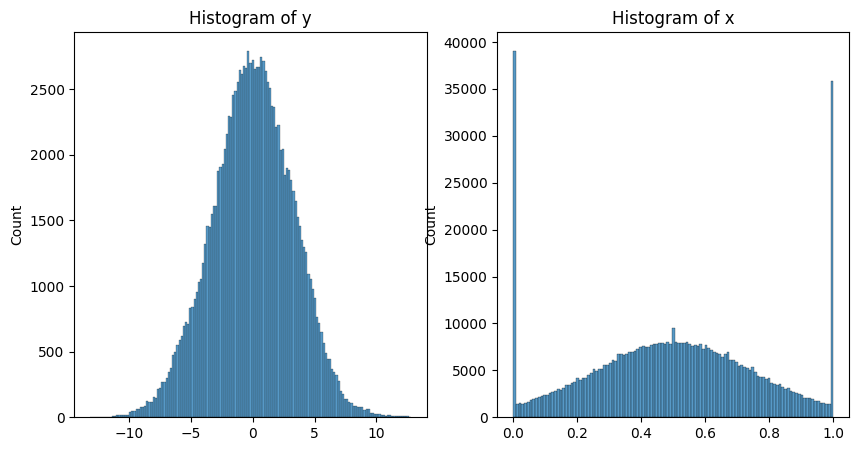

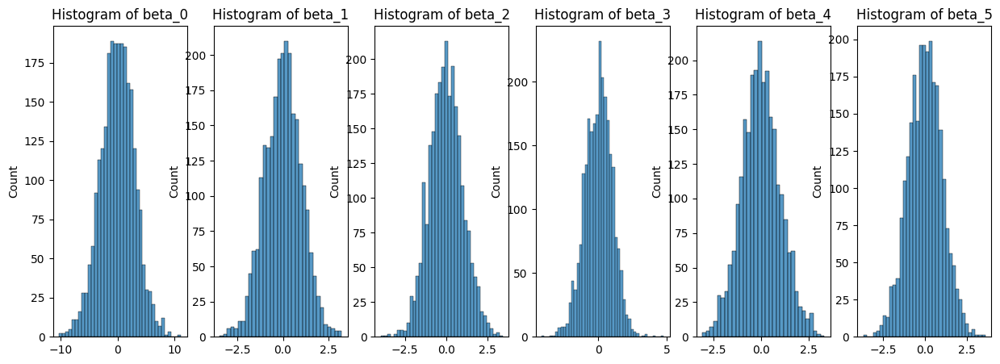

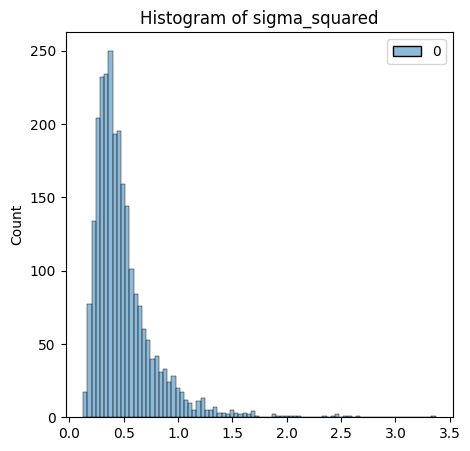

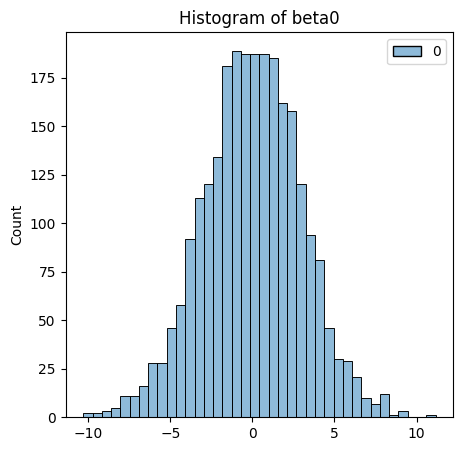

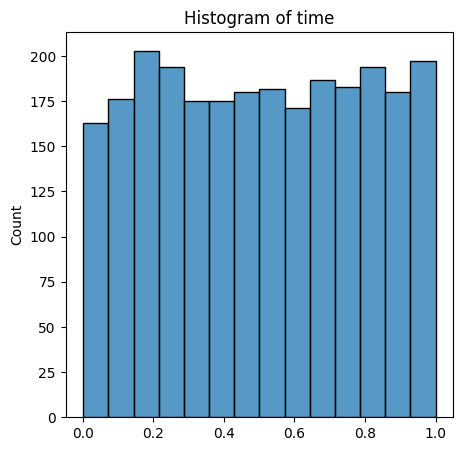

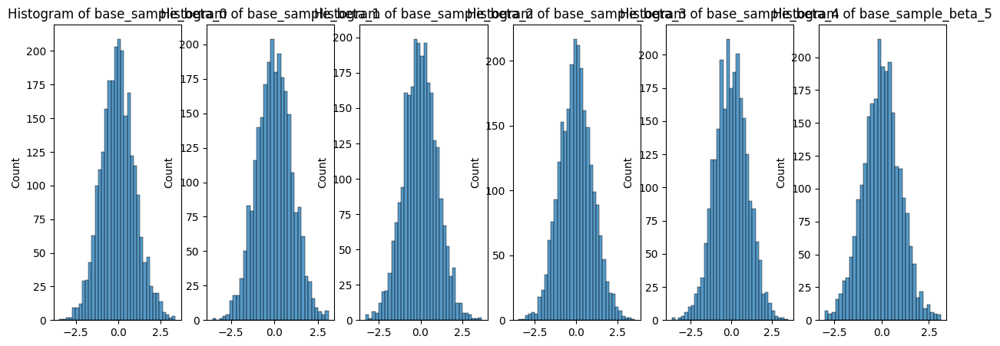

[{'X': {'mean': tensor(0.4962),
   'variance': tensor(0.0726),
   'min': tensor(0.),
   'max': tensor(1.)},
  'y': {'mean': tensor(0.0337),
   'variance': tensor(10.8689),
   'min': tensor(-13.0297),
   'max': tensor(12.4742)},
  'beta': {'mean': tensor([ 0.0321, -0.0137,  0.0017, -0.0329,  0.0152,  0.0310]),
   'variance': tensor([8.8939, 0.9991, 1.0655, 1.0098, 0.9977, 1.0386]),
   'min': tensor([-9.3898, -3.2065, -4.1424, -3.5956, -3.3493, -3.2896]),
   'max': tensor([9.0342, 3.2358, 3.6786, 3.3350, 3.4849, 4.0583])}},
 {'X': {'mean': tensor(0.4981),
   'variance': tensor(0.0721),
   'min': tensor(0.),
   'max': tensor(1.)},
  'y': {'mean': tensor(0.0141),
   'variance': tensor(10.8514),
   'min': tensor(-13.1199),
   'max': tensor(12.7665)},
  'beta': {'mean': tensor([-0.0142,  0.0104, -0.0009,  0.0088,  0.0095,  0.0178]),
   'variance': tensor([8.9174, 1.0193, 1.0192, 0.9983, 1.0391, 1.0035]),
   'min': tensor([-10.3073,  -3.4667,  -3.9566,  -4.1528,  -3.0651,  -3.6661]),
   'max'

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = P,
    n = N,
    used_batch_samples = 10
)

In [ ]:
data_generator.render_model()

AssertionError: X.shape = torch.Size([1, 50, 5]), expected shape = (1, 1, 10)

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
sample_batch = next(iter(epoch_loader[0][0]))

In [ ]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'beta0', 'time', 'base_sample_beta'])

In [ ]:

model = TransformerCNFConditionalDecoder(
    n_input_features_encoder = P+1,
    n_input_features_decoder = P+1,
    d_model_encoder = 512,
    d_model_decoder = 512,
    n_heads_encoder = 8,
    n_heads_decoder = 8,
    d_ff_encoder = 1024,
    d_ff_decoder = 1024,
    dropout_encoder = 0.1,
    dropout_decoder = 0.1,
    n_conditional_input_features =  1,
    n_condition_features = 512,
    n_layers_condition_embedding = 3,
    n_layers_encoder = 8,
    n_layers_decoder = 6,
    use_positional_encoding_encoder = True,
    use_positional_encoding_decoder = False,
    use_self_attention_decoder = False,
    output_dim = P+1,
    d_final_processing = 512,
    n_final_layers = 3,
    dropout_final = 0.1,
    treat_z_as_sequence = False,
)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'4.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-6
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOT2(
    sigma_min=1e-4
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 5e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e4)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    coupling = None,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    max_gradient_norm = 1.0

)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_05_14_40_10")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_06_18_17_12'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

Could not load model


In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


{'loss_mean': 3.3101789951324463,
 'loss_median': 3.3046493530273438,
 'loss_std': 0.09081313014030457}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 0


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 0:
Training: {'loss_mean': 3.410614013671875, 'loss_median': 3.406277656555176, 'loss_std': 0.08855115622282028}
Validation: {'loss_mean': 3.294463872909546, 'loss_median': 3.3088736534118652, 'loss_std': 0.08146684616804123}
Validation curriculum: {'loss_mean': 3.3133327960968018, 'loss_median': 3.316272258758545, 'loss_std': 0.07004345953464508}
Time: 370.62164664268494
Learning rate: [2.2956007119594385e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 249856


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 1:
Training: {'loss_mean': 3.3061022758483887, 'loss_median': 3.3193817138671875, 'loss_std': 0.11452122777700424}
Validation: {'loss_mean': 2.913658857345581, 'loss_median': 2.9042162895202637, 'loss_std': 0.06717317551374435}
Validation curriculum: {'loss_mean': 2.901947259902954, 'loss_median': 2.914684772491455, 'loss_std': 0.06828183680772781}
Time: 370.5386188030243
Learning rate: [3.175121199428514e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 499712


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 2:
Training: {'loss_mean': 2.485142707824707, 'loss_median': 2.417210340499878, 'loss_std': 0.28465721011161804}
Validation: {'loss_mean': 2.24334716796875, 'loss_median': 2.2390472888946533, 'loss_std': 0.047057125717401505}
Validation curriculum: {'loss_mean': 2.2518253326416016, 'loss_median': 2.247882843017578, 'loss_std': 0.0431041456758976}
Time: 370.5239357948303
Learning rate: [4.616895888883983e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 749568


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 3:
Training: {'loss_mean': 2.0269758701324463, 'loss_median': 2.0193326473236084, 'loss_std': 0.0732785016298294}
Validation: {'loss_mean': 1.980930209159851, 'loss_median': 1.9812077283859253, 'loss_std': 0.03369104489684105}
Validation curriculum: {'loss_mean': 1.9717156887054443, 'loss_median': 1.973166823387146, 'loss_std': 0.037147652357816696}
Time: 370.10349917411804
Learning rate: [6.58540897826852e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 999424


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 4:
Training: {'loss_mean': 1.9016269445419312, 'loss_median': 1.9014734029769897, 'loss_std': 0.042826492339372635}
Validation: {'loss_mean': 1.7937465906143188, 'loss_median': 1.8063253164291382, 'loss_std': 0.03914809226989746}
Validation curriculum: {'loss_mean': 1.8024687767028809, 'loss_median': 1.812886118888855, 'loss_std': 0.041167087852954865}
Time: 370.5490758419037
Learning rate: [9.032169311688483e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1249280


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 5:
Training: {'loss_mean': 1.719340443611145, 'loss_median': 1.7128424644470215, 'loss_std': 0.05934728682041168}
Validation: {'loss_mean': 1.5846823453903198, 'loss_median': 1.580613374710083, 'loss_std': 0.02824510633945465}
Validation curriculum: {'loss_mean': 1.5851411819458008, 'loss_median': 1.586199164390564, 'loss_std': 0.03073379583656788}
Time: 370.17584443092346
Learning rate: [0.0001189690488109779]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1499136


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 6:
Training: {'loss_mean': 1.5364681482315063, 'loss_median': 1.5352834463119507, 'loss_std': 0.057744238525629044}
Validation: {'loss_mean': 1.4399791955947876, 'loss_median': 1.4425160884857178, 'loss_std': 0.0291814673691988}
Validation curriculum: {'loss_mean': 1.4442998170852661, 'loss_median': 1.4413518905639648, 'loss_std': 0.028351224958896637}
Time: 369.8749279975891
Learning rate: [0.00015109047530338697]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1748992


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 7:
Training: {'loss_mean': 1.3862860202789307, 'loss_median': 1.3927419185638428, 'loss_std': 0.07266014069318771}
Validation: {'loss_mean': 1.249232292175293, 'loss_median': 1.2470066547393799, 'loss_std': 0.03283689171075821}
Validation curriculum: {'loss_mean': 1.2495927810668945, 'loss_median': 1.2463436126708984, 'loss_std': 0.0270782932639122}
Time: 369.14847326278687
Learning rate: [0.00018589471288241952]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1998848


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 8:
Training: {'loss_mean': 1.1493371725082397, 'loss_median': 1.1584064960479736, 'loss_std': 0.0959969162940979}
Validation: {'loss_mean': 0.9553543925285339, 'loss_median': 0.9553432464599609, 'loss_std': 0.022386208176612854}
Validation curriculum: {'loss_mean': 0.9588193297386169, 'loss_median': 0.9573391675949097, 'loss_std': 0.031262632459402084}
Time: 368.63443088531494
Learning rate: [0.00022252441509744512]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2248704


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 9:
Training: {'loss_mean': 0.8820458650588989, 'loss_median': 0.8725390434265137, 'loss_std': 0.047799624502658844}
Validation: {'loss_mean': 0.7747449278831482, 'loss_median': 0.773852527141571, 'loss_std': 0.02024785429239273}
Validation curriculum: {'loss_mean': 0.7758750319480896, 'loss_median': 0.7735538482666016, 'loss_std': 0.02535487338900566}
Time: 368.0953207015991
Learning rate: [0.0002600772681106616]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2498560


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 10:
Training: {'loss_mean': 0.8035823702812195, 'loss_median': 0.8006526231765747, 'loss_std': 0.03243737295269966}
Validation: {'loss_mean': 0.7451469898223877, 'loss_median': 0.7432518005371094, 'loss_std': 0.01946539804339409}
Validation curriculum: {'loss_mean': 0.7373070120811462, 'loss_median': 0.7342259287834167, 'loss_std': 0.019810937345027924}
Time: 368.0115168094635
Learning rate: [0.0002976282177481679]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2748416


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 11:
Training: {'loss_mean': 0.7771156430244446, 'loss_median': 0.7739917635917664, 'loss_std': 0.03392929211258888}
Validation: {'loss_mean': 0.811281144618988, 'loss_median': 0.811293363571167, 'loss_std': 0.022222040221095085}
Validation curriculum: {'loss_mean': 0.8131312727928162, 'loss_median': 0.8112558126449585, 'loss_std': 0.025001995265483856}
Time: 367.562433719635
Learning rate: [0.0003342522567226638]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2998272


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 12:
Training: {'loss_mean': 0.7608252167701721, 'loss_median': 0.7586669325828552, 'loss_std': 0.029675276950001717}
Validation: {'loss_mean': 0.7607904672622681, 'loss_median': 0.760783851146698, 'loss_std': 0.022834286093711853}
Validation curriculum: {'loss_mean': 0.7620267271995544, 'loss_median': 0.7621899843215942, 'loss_std': 0.020970720797777176}
Time: 366.99345779418945
Learning rate: [0.0003690472107011752]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3248128


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 13:
Training: {'loss_mean': 0.7493651509284973, 'loss_median': 0.7482113838195801, 'loss_std': 0.030816631391644478}
Validation: {'loss_mean': 0.7148424983024597, 'loss_median': 0.717969536781311, 'loss_std': 0.022181807085871696}
Validation curriculum: {'loss_mean': 0.7170611023902893, 'loss_median': 0.7178255319595337, 'loss_std': 0.02297443337738514}
Time: 366.8530421257019
Learning rate: [0.0004011559619196486]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3497984


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 14:
Training: {'loss_mean': 0.7365434765815735, 'loss_median': 0.7369315028190613, 'loss_std': 0.028363212943077087}
Validation: {'loss_mean': 0.6950879096984863, 'loss_median': 0.693425178527832, 'loss_std': 0.018277838826179504}
Validation curriculum: {'loss_mean': 0.6961965560913086, 'loss_median': 0.6942451000213623, 'loss_std': 0.018543178215622902}
Time: 366.6626355648041
Learning rate: [0.00042978756290139113]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3747840


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 15:
Training: {'loss_mean': 0.7275139093399048, 'loss_median': 0.7244943380355835, 'loss_std': 0.029110761359333992}
Validation: {'loss_mean': 0.7117653489112854, 'loss_median': 0.7103661298751831, 'loss_std': 0.020808402448892593}
Validation curriculum: {'loss_mean': 0.7135282158851624, 'loss_median': 0.7133786082267761, 'loss_std': 0.01904447004199028}
Time: 366.3680582046509
Learning rate: [0.0004542367201768414]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3997696


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 16:
Training: {'loss_mean': 0.7199234962463379, 'loss_median': 0.7189738154411316, 'loss_std': 0.02770175412297249}
Validation: {'loss_mean': 0.7129323482513428, 'loss_median': 0.7121195793151855, 'loss_std': 0.014250189997255802}
Validation curriculum: {'loss_mean': 0.7095606923103333, 'loss_median': 0.7068356275558472, 'loss_std': 0.01821950636804104}
Time: 366.6718544960022
Learning rate: [0.0004739011680545465]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4247552


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 17:
Training: {'loss_mean': 0.7202974557876587, 'loss_median': 0.7151967883110046, 'loss_std': 0.031711068004369736}
Validation: {'loss_mean': 0.7042086720466614, 'loss_median': 0.7060918807983398, 'loss_std': 0.020540576428174973}
Validation curriculum: {'loss_mean': 0.7083740830421448, 'loss_median': 0.7041405439376831, 'loss_std': 0.022328410297632217}
Time: 365.88248443603516
Learning rate: [0.0004882965044684283]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4497408


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 18:
Training: {'loss_mean': 0.7079418897628784, 'loss_median': 0.7042751312255859, 'loss_std': 0.030562013387680054}
Validation: {'loss_mean': 0.7230525016784668, 'loss_median': 0.722766637802124, 'loss_std': 0.020365791395306587}
Validation curriculum: {'loss_mean': 0.7276399731636047, 'loss_median': 0.725703239440918, 'loss_std': 0.01853148452937603}
Time: 365.675030708313
Learning rate: [0.0004970681234440837]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4747264


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 19:
Training: {'loss_mean': 0.7018234133720398, 'loss_median': 0.7015913724899292, 'loss_std': 0.025954214856028557}
Validation: {'loss_mean': 0.6874731183052063, 'loss_median': 0.6877745985984802, 'loss_std': 0.021367311477661133}
Validation curriculum: {'loss_mean': 0.6851535439491272, 'loss_median': 0.6808747053146362, 'loss_std': 0.02217889204621315}
Time: 365.7695162296295
Learning rate: [0.000499999999360437]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4997120


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 20:
Training: {'loss_mean': 0.7011253833770752, 'loss_median': 0.6990118026733398, 'loss_std': 0.026386043056845665}
Validation: {'loss_mean': 0.6531709432601929, 'loss_median': 0.6530511379241943, 'loss_std': 0.01903846301138401}
Validation curriculum: {'loss_mean': 0.6530376076698303, 'loss_median': 0.65293949842453, 'loss_std': 0.021938877180218697}
Time: 365.63124322891235
Learning rate: [0.0004999616112110189]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5246976


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 21:
Training: {'loss_mean': 0.6920349597930908, 'loss_median': 0.6894592642784119, 'loss_std': 0.026970593258738518}
Validation: {'loss_mean': 0.6423714756965637, 'loss_median': 0.6440138816833496, 'loss_std': 0.02067684195935726}
Validation curriculum: {'loss_mean': 0.6466343998908997, 'loss_median': 0.6461254954338074, 'loss_std': 0.017368756234645844}
Time: 365.5963189601898
Learning rate: [0.0004998470826380032]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5496832


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 22:
Training: {'loss_mean': 0.6838230490684509, 'loss_median': 0.6812989115715027, 'loss_std': 0.02538442052900791}
Validation: {'loss_mean': 0.7085614800453186, 'loss_median': 0.7091453075408936, 'loss_std': 0.01808139868080616}
Validation curriculum: {'loss_mean': 0.7127530574798584, 'loss_median': 0.7104848623275757, 'loss_std': 0.0197692159563303}
Time: 366.0793454647064
Learning rate: [0.0004996564485279027]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5746688


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 23:
Training: {'loss_mean': 0.6793003678321838, 'loss_median': 0.676627516746521, 'loss_std': 0.024623548611998558}
Validation: {'loss_mean': 0.6544740796089172, 'loss_median': 0.6535284519195557, 'loss_std': 0.019063647836446762}
Validation curriculum: {'loss_mean': 0.651128351688385, 'loss_median': 0.6516082286834717, 'loss_std': 0.021549157798290253}
Time: 365.7774667739868
Learning rate: [0.0004993897669497137]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5996544


100%|██████████| 49/49 [00:20<00:00,  2.35it/s]


Epoch 24:
Training: {'loss_mean': 0.6765794157981873, 'loss_median': 0.6738256216049194, 'loss_std': 0.024684607982635498}
Validation: {'loss_mean': 0.6224976778030396, 'loss_median': 0.6241042017936707, 'loss_std': 0.017603306099772453}
Validation curriculum: {'loss_mean': 0.6272439956665039, 'loss_median': 0.6256191730499268, 'loss_std': 0.02319490909576416}
Time: 365.34922432899475
Learning rate: [0.0004990471191372288]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6246400


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 25:
Training: {'loss_mean': 0.6746914982795715, 'loss_median': 0.669411838054657, 'loss_std': 0.02780846692621708}
Validation: {'loss_mean': 0.6887224316596985, 'loss_median': 0.6872248649597168, 'loss_std': 0.018628235906362534}
Validation curriculum: {'loss_mean': 0.6934137940406799, 'loss_median': 0.6981409788131714, 'loss_std': 0.0238675307482481}
Time: 365.65247631073
Learning rate: [0.0004986286094642908]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6496256


100%|██████████| 49/49 [00:21<00:00,  2.33it/s]


Epoch 26:
Training: {'loss_mean': 0.6715933084487915, 'loss_median': 0.670451819896698, 'loss_std': 0.027211902663111687}
Validation: {'loss_mean': 0.6309621334075928, 'loss_median': 0.6324660778045654, 'loss_std': 0.01652504876255989}
Validation curriculum: {'loss_mean': 0.6325363516807556, 'loss_median': 0.6336523294448853, 'loss_std': 0.018102407455444336}
Time: 365.44960284233093
Learning rate: [0.0004981343654130001]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6746112


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 27:
Training: {'loss_mean': 0.663925051689148, 'loss_median': 0.664901077747345, 'loss_std': 0.02433793619275093}
Validation: {'loss_mean': 0.6211415529251099, 'loss_median': 0.6214799284934998, 'loss_std': 0.020989619195461273}
Validation curriculum: {'loss_mean': 0.6210690140724182, 'loss_median': 0.6246757507324219, 'loss_std': 0.02121041528880596}
Time: 365.2596607208252
Learning rate: [0.0004975645375348827]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6995968


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 28:
Training: {'loss_mean': 0.6647679209709167, 'loss_median': 0.6609534621238708, 'loss_std': 0.02493283525109291}
Validation: {'loss_mean': 0.6494590044021606, 'loss_median': 0.6463426351547241, 'loss_std': 0.016241878271102905}
Validation curriculum: {'loss_mean': 0.6494300961494446, 'loss_median': 0.6493495106697083, 'loss_std': 0.019480474293231964}
Time: 365.8198926448822
Learning rate: [0.0004969192994050305]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7245824


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 29:
Training: {'loss_mean': 0.6613665819168091, 'loss_median': 0.6596367955207825, 'loss_std': 0.024786606431007385}
Validation: {'loss_mean': 0.6089860796928406, 'loss_median': 0.6122012138366699, 'loss_std': 0.022502250969409943}
Validation curriculum: {'loss_mean': 0.6129768490791321, 'loss_median': 0.6130967140197754, 'loss_std': 0.018429987132549286}
Time: 365.90553426742554
Learning rate: [0.0004961988475692281]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7495680


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 30:
Training: {'loss_mean': 0.6591310501098633, 'loss_median': 0.6577006578445435, 'loss_std': 0.026583921164274216}
Validation: {'loss_mean': 0.5988724231719971, 'loss_median': 0.5989596843719482, 'loss_std': 0.01694876328110695}
Validation curriculum: {'loss_mean': 0.5974555611610413, 'loss_median': 0.5940873622894287, 'loss_std': 0.016916632652282715}
Time: 365.44707703590393
Learning rate: [0.0004954034014840841]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7745536


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 31:
Training: {'loss_mean': 0.6568995714187622, 'loss_median': 0.654361367225647, 'loss_std': 0.023634694516658783}
Validation: {'loss_mean': 0.6478387713432312, 'loss_median': 0.6445538997650146, 'loss_std': 0.020137209445238113}
Validation curriculum: {'loss_mean': 0.6501657366752625, 'loss_median': 0.6510282754898071, 'loss_std': 0.021652929484844208}
Time: 365.4408657550812
Learning rate: [0.0004945332034501816]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7995392


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 32:
Training: {'loss_mean': 0.6526047587394714, 'loss_median': 0.6512169241905212, 'loss_std': 0.024598577991127968}
Validation: {'loss_mean': 0.6341767311096191, 'loss_median': 0.6331422328948975, 'loss_std': 0.016925258561968803}
Validation curriculum: {'loss_mean': 0.6333463788032532, 'loss_median': 0.6321393847465515, 'loss_std': 0.018386874347925186}
Time: 365.361953496933
Learning rate: [0.0004935885185382714]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8245248


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 33:
Training: {'loss_mean': 0.6560869216918945, 'loss_median': 0.6535590291023254, 'loss_std': 0.024847671389579773}
Validation: {'loss_mean': 0.6168773174285889, 'loss_median': 0.6169050931930542, 'loss_std': 0.021953215822577477}
Validation curriculum: {'loss_mean': 0.6148917078971863, 'loss_median': 0.6136966347694397, 'loss_std': 0.019236505031585693}
Time: 365.4527928829193
Learning rate: [0.0004925696345085293]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8495104


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 34:
Training: {'loss_mean': 0.6597779989242554, 'loss_median': 0.6561017632484436, 'loss_std': 0.024185389280319214}
Validation: {'loss_mean': 0.6621444225311279, 'loss_median': 0.6627298593521118, 'loss_std': 0.019571438431739807}
Validation curriculum: {'loss_mean': 0.6595432758331299, 'loss_median': 0.6637176275253296, 'loss_std': 0.023382751271128654}
Time: 365.5362205505371
Learning rate: [0.0004914768617229007]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8744960


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 35:
Training: {'loss_mean': 0.6524529457092285, 'loss_median': 0.6522915959358215, 'loss_std': 0.021428994834423065}
Validation: {'loss_mean': 0.6381107568740845, 'loss_median': 0.6351603269577026, 'loss_std': 0.021544158458709717}
Validation curriculum: {'loss_mean': 0.6382736563682556, 'loss_median': 0.6406884789466858, 'loss_std': 0.024978578090667725}
Time: 365.6448132991791
Learning rate: [0.0004903105330505622]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8994816


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 36:
Training: {'loss_mean': 0.6490651369094849, 'loss_median': 0.6484537124633789, 'loss_std': 0.02298876829445362}
Validation: {'loss_mean': 0.6784648299217224, 'loss_median': 0.6820601224899292, 'loss_std': 0.01946411281824112}
Validation curriculum: {'loss_mean': 0.6754902601242065, 'loss_median': 0.6734471321105957, 'loss_std': 0.018071668222546577}
Time: 365.41397190093994
Learning rate: [0.0004890710037665258]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9244672


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 37:
Training: {'loss_mean': 0.6516652703285217, 'loss_median': 0.65141761302948, 'loss_std': 0.022946802899241447}
Validation: {'loss_mean': 0.6024184823036194, 'loss_median': 0.6033713221549988, 'loss_std': 0.016185613349080086}
Validation curriculum: {'loss_mean': 0.599507212638855, 'loss_median': 0.5989753603935242, 'loss_std': 0.02069779485464096}
Time: 365.32876658439636
Learning rate: [0.0004877586514434188]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9494528


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 38:
Training: {'loss_mean': 0.6448361277580261, 'loss_median': 0.6424408555030823, 'loss_std': 0.02239111065864563}
Validation: {'loss_mean': 0.6174151301383972, 'loss_median': 0.6141161918640137, 'loss_std': 0.019863277673721313}
Validation curriculum: {'loss_mean': 0.6110590100288391, 'loss_median': 0.6116330623626709, 'loss_std': 0.01802828535437584}
Time: 365.2411608695984
Learning rate: [0.00048637387583647215]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9744384


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 39:
Training: {'loss_mean': 0.6434812545776367, 'loss_median': 0.6431502103805542, 'loss_std': 0.022346416488289833}
Validation: {'loss_mean': 0.5888043642044067, 'loss_median': 0.5878645777702332, 'loss_std': 0.017080610617995262}
Validation curriculum: {'loss_mean': 0.5950068831443787, 'loss_median': 0.5889257788658142, 'loss_std': 0.023671800270676613}
Time: 365.2250392436981
Learning rate: [0.0004849170987617503]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9994240


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 40:
Training: {'loss_mean': 0.6427234411239624, 'loss_median': 0.640166699886322, 'loss_std': 0.023371532559394836}
Validation: {'loss_mean': 0.6160449385643005, 'loss_median': 0.6177595257759094, 'loss_std': 0.022621603682637215}
Validation curriculum: {'loss_mean': 0.6196080446243286, 'loss_median': 0.6173105239868164, 'loss_std': 0.01809847354888916}
Time: 365.73835825920105
Learning rate: [0.00048338876396766226]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10244096


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 41:
Training: {'loss_mean': 0.6423273682594299, 'loss_median': 0.6430442333221436, 'loss_std': 0.02176675572991371}
Validation: {'loss_mean': 0.6135261058807373, 'loss_median': 0.613083004951477, 'loss_std': 0.017510192468762398}
Validation curriculum: {'loss_mean': 0.610973060131073, 'loss_median': 0.6072263121604919, 'loss_std': 0.018300198018550873}
Time: 365.2869122028351
Learning rate: [0.00048178933699979156]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10493952


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 42:
Training: {'loss_mean': 0.6397231221199036, 'loss_median': 0.6380839943885803, 'loss_std': 0.0222691148519516}
Validation: {'loss_mean': 0.6066433787345886, 'loss_median': 0.6040294170379639, 'loss_std': 0.019696509465575218}
Validation curriculum: {'loss_mean': 0.6050055623054504, 'loss_median': 0.605658769607544, 'loss_std': 0.015694713220000267}
Time: 365.141478061676
Learning rate: [0.00048011930505908676]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10743808


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 43:
Training: {'loss_mean': 0.6351450681686401, 'loss_median': 0.634434700012207, 'loss_std': 0.019415147602558136}
Validation: {'loss_mean': 0.6035488843917847, 'loss_median': 0.6038424968719482, 'loss_std': 0.021984143182635307}
Validation curriculum: {'loss_mean': 0.6051759719848633, 'loss_median': 0.6064879298210144, 'loss_std': 0.019450629130005836}
Time: 365.0527379512787
Learning rate: [0.00047837917685345486]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10993664


100%|██████████| 49/49 [00:20<00:00,  2.36it/s]


Epoch 44:
Training: {'loss_mean': 0.6326217651367188, 'loss_median': 0.6303530931472778, 'loss_std': 0.022805247455835342}
Validation: {'loss_mean': 0.6158807873725891, 'loss_median': 0.6138903498649597, 'loss_std': 0.01743035949766636}
Validation curriculum: {'loss_mean': 0.6207728385925293, 'loss_median': 0.6212422847747803, 'loss_std': 0.020613795146346092}
Time: 365.0275959968567
Learning rate: [0.00047656948244280433]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11243520


100%|██████████| 49/49 [00:20<00:00,  2.35it/s]


Epoch 45:
Training: {'loss_mean': 0.6305042505264282, 'loss_median': 0.6310954093933105, 'loss_std': 0.02264232188463211}
Validation: {'loss_mean': 0.5953248739242554, 'loss_median': 0.5908747911453247, 'loss_std': 0.019800739362835884}
Validation curriculum: {'loss_mean': 0.5932996869087219, 'loss_median': 0.591987133026123, 'loss_std': 0.01908138580620289}
Time: 365.30595803260803
Learning rate: [0.0004746907730775835]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11493376


100%|██████████| 49/49 [00:20<00:00,  2.36it/s]


Epoch 46:
Training: {'loss_mean': 0.6317934989929199, 'loss_median': 0.6319986581802368, 'loss_std': 0.02033817768096924}
Validation: {'loss_mean': 0.5944041609764099, 'loss_median': 0.5954152345657349, 'loss_std': 0.018412290140986443}
Validation curriculum: {'loss_mean': 0.5943660140037537, 'loss_median': 0.5937606692314148, 'loss_std': 0.01965801604092121}
Time: 365.3189597129822
Learning rate: [0.00047274362103086456]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11743232


100%|██████████| 49/49 [00:20<00:00,  2.35it/s]


Epoch 47:
Training: {'loss_mean': 0.6281214952468872, 'loss_median': 0.6270736455917358, 'loss_std': 0.022323021665215492}
Validation: {'loss_mean': 0.6057965159416199, 'loss_median': 0.6058523058891296, 'loss_std': 0.016599856317043304}
Validation curriculum: {'loss_mean': 0.6060347557067871, 'loss_median': 0.6073613166809082, 'loss_std': 0.01604914292693138}
Time: 365.0813670158386
Learning rate: [0.0004707286194240234]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11993088


 88%|████████▊ | 214/244 [04:43<00:39,  1.32s/it]

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

In [ ]:
trainer.test()

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P+1,),
    n_samples=1000,
    batch_size = BATCH_SIZE,
    solve_adjoint = True,
    atol = 1e-5,
    rtol = 1e-5,
    #device = torch.device("cpu")
)
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig_intercept(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






In [ ]:
trainer.test()

In [ ]:
#?ModelToPosteriorCNF

In [ ]:


hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
str(full_model)

In [ ]:
#str(analytical_solution)

In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        hmc_sampler,
                        vi_multivariate_normal,
                        vi_diag,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

In [72]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]
0it [00:00, ?it/s]
Sampling posterior:   1%|          | 1/100 [00:55<1:31:53, 55.69s/it]
0it [00:00, ?it/s]
Sampling posterior:   2%|▏         | 2/100 [01:39<1:19:07, 48.45s/it]
0it [00:00, ?it/s]
Sampling posterior:   3%|▎         | 3/100 [02:27<1:18:09, 48.35s/it]
0it [00:00, ?it/s]
Sampling posterior:   4%|▍         | 4/100 [03:29<1:26:14, 53.90s/it]
0it [00:00, ?it/s]
Sampling posterior:   5%|▌         | 5/100 [04:17<1:22:05, 51.84s/it]
0it [00:00, ?it/s]
Sampling posterior:   6%|▌         | 6/100 [05:13<1:23:04, 53.03s/it]
0it [00:00, ?it/s]
Sampling posterior:   7%|▋         | 7/100 [06:08<1:23:10, 53.66s/it]
0it [00:00, ?it/s]
Sampling posterior:   8%|▊         | 8/100 [07:01<1:21:55, 53.43s/it]
0it [00:00, ?it/s]
Sampling posterior:   9%|▉         | 9/100 [07:56<1:21:48, 53.94s/it]
0it [00:00, ?it/s]
Sampling posterior:  10%|█         | 10/100 [08:56<1:23:39, 55.77s/it]
0it [00:00, ?it/s]
Sampling posterior:  11%|█    

....................


Sampling posterior:   1%|          | 1/100 [00:15<25:58, 15.74s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:30<24:56, 15.27s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:45<24:26, 15.12s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:00<23:51, 14.92s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:15<23:32, 14.87s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:30<23:28, 14.99s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:45<23:20, 15.06s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:00<23:01, 15.01s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:15<22:55, 15.12s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:30<22:30, 15.00s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:44<22:01, 14.85s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:00<21:56, 14.96s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:14<21:30, 14.83s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:29<21:21, 14.91s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:44<21:10, 14.95s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:59<20:51, 14.90s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:14<20:31, 14.83s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:29<20:27, 14.98s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:44<20:01, 14.84s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:58<19:41, 14.76s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:13<19:37, 14.90s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:28<19:17, 14.84s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:43<19:03, 14.85s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:58<18:47, 14.83s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:13<18:31, 14.82s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:28<18:25, 14.94s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:43<18:16, 15.02s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:58<18:00, 15.01s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:13<17:42, 14.96s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:28<17:26, 14.94s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:42<17:03, 14.84s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:58<16:58, 14.98s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:12<16:35, 14.86s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:27<16:25, 14.94s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:43<16:17, 15.04s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:57<15:58, 14.98s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:12<15:41, 14.94s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:27<15:30, 15.01s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:42<15:09, 14.91s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:57<14:59, 15.00s/it]

....................


Sampling posterior:  41%|████      | 41/100 [10:13<14:48, 15.06s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:27<14:29, 14.99s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:42<14:10, 14.92s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:57<13:55, 14.92s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [11:12<13:40, 14.91s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:27<13:27, 14.96s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:42<13:14, 15.00s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:57<12:55, 14.90s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [12:11<12:36, 14.83s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [12:26<12:24, 14.88s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:41<12:08, 14.87s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:56<11:57, 14.95s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [13:11<11:36, 14.81s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [13:26<11:25, 14.90s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:41<11:10, 14.90s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:55<10:51, 14.80s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [14:10<10:35, 14.77s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [14:25<10:23, 14.84s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [14:40<10:04, 14.75s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:55<09:52, 14.82s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [15:10<09:43, 14.97s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [15:25<09:23, 14.84s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [15:39<09:08, 14.83s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:54<08:56, 14.89s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [16:09<08:39, 14.84s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [16:24<08:22, 14.77s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [16:39<08:09, 14.84s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:53<07:53, 14.81s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [17:08<07:38, 14.79s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [17:23<07:24, 14.81s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [17:38<07:10, 14.85s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:53<06:55, 14.86s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [18:08<06:44, 14.98s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [18:23<06:27, 14.91s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [18:38<06:12, 14.91s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [18:53<05:58, 14.93s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [19:08<05:43, 14.93s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [19:22<05:26, 14.85s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [19:37<05:12, 14.90s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [19:53<05:00, 15.01s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [20:08<04:44, 14.99s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [20:23<04:29, 14.98s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [20:38<04:14, 14.97s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [20:52<03:57, 14.84s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [21:07<03:43, 14.90s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [21:22<03:28, 14.89s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [21:37<03:14, 14.92s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [21:52<02:59, 14.98s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [22:07<02:44, 14.94s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [22:22<02:28, 14.90s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [22:37<02:14, 14.97s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [22:52<01:59, 14.93s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [23:06<01:44, 14.86s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [23:21<01:29, 14.92s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [23:36<01:14, 14.91s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [23:51<00:59, 14.83s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [24:06<00:44, 14.95s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [24:21<00:29, 14.83s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [24:35<00:14, 14.71s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<20:56, 12.70s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:42, 12.68s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:38<20:29, 12.68s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:27, 12.79s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:03<20:15, 12.79s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:16<19:56, 12.73s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:29<19:51, 12.82s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:42<19:34, 12.76s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:54<19:19, 12.74s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:07<19:13, 12.82s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:20<18:57, 12.79s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:33<18:43, 12.76s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:46<18:36, 12.84s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:58<18:20, 12.80s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:11<18:06, 12.78s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:24<17:59, 12.86s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:37<17:41, 12.79s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:50<17:28, 12.78s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:02<17:17, 12.81s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:15<17:08, 12.86s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:28<16:55, 12.85s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:41<16:41, 12.84s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:54<16:29, 12.86s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:07<16:13, 12.81s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:19<15:56, 12.75s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:32<15:47, 12.80s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:45<15:29, 12.74s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:57<15:14, 12.71s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:10<15:08, 12.80s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:23<14:55, 12.79s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:36<14:42, 12.78s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:49<14:33, 12.85s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:02<14:19, 12.83s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:14<14:05, 12.80s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:27<13:54, 12.84s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:40<13:37, 12.77s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:53<13:23, 12.75s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:06<13:14, 12.82s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:18<12:59, 12.78s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:31<12:45, 12.77s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:44<12:39, 12.87s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:57<12:23, 12.82s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:10<12:10, 12.82s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:23<12:01, 12.89s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:36<11:46, 12.84s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:48<11:30, 12.79s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:01<11:15, 12.75s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:14<11:06, 12.81s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:27<10:53, 12.81s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:39<10:39, 12.78s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:52<10:28, 12.82s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:05<10:11, 12.75s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:18<09:59, 12.75s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:30<09:47, 12.78s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:43<09:32, 12.72s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:56<09:19, 12.71s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:09<09:09, 12.78s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:21<08:57, 12.79s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:34<08:42, 12.75s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:47<08:33, 12.84s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:00<08:20, 12.83s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:13<08:07, 12.82s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:26<07:56, 12.87s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:39<07:42, 12.84s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:51<07:27, 12.80s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:04<07:17, 12.87s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:17<07:02, 12.81s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:30<06:48, 12.77s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:42<06:37, 12.81s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:55<06:22, 12.76s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:08<06:09, 12.73s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:21<05:58, 12.82s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:33<05:44, 12.77s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:46<05:31, 12.73s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:59<05:18, 12.73s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:12<05:08, 12.86s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:25<04:55, 12.87s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:38<04:41, 12.81s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:51<04:30, 12.87s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:03<04:16, 12.80s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:16<04:02, 12.79s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:29<03:51, 12.88s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:42<03:37, 12.81s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:54<03:24, 12.78s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:07<03:12, 12.83s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:20<02:59, 12.82s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:33<02:46, 12.81s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:46<02:34, 12.84s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:59<02:21, 12.84s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:12<02:08, 12.85s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:25<01:56, 12.94s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:37<01:42, 12.84s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:50<01:29, 12.79s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:03<01:17, 12.85s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:16<01:03, 12.80s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:28<00:51, 12.80s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:41<00:38, 12.85s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:54<00:25, 12.81s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:07<00:12, 12.80s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:11<18:48, 11.40s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:22<18:24, 11.27s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:33<18:17, 11.31s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:45<18:14, 11.40s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:56<18:00, 11.38s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:08<17:46, 11.34s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:19<17:42, 11.42s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:30<17:24, 11.36s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:42<17:10, 11.32s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:53<16:58, 11.31s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:04<16:53, 11.38s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:16<16:41, 11.39s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:27<16:26, 11.34s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:39<16:18, 11.37s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:50<16:04, 11.35s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:01<15:49, 11.30s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:13<15:46, 11.40s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:24<15:34, 11.40s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:35<15:20, 11.36s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:47<15:08, 11.35s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:58<15:01, 11.41s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:10<14:47, 11.37s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:21<14:37, 11.40s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:33<14:31, 11.47s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:44<14:14, 11.39s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:55<13:59, 11.34s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:07<13:53, 11.42s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:18<13:39, 11.38s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:29<13:26, 11.36s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:41<13:13, 11.34s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:52<13:06, 11.40s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:03<12:53, 11.37s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:15<12:39, 11.34s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:26<12:32, 11.40s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:37<12:19, 11.38s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:49<12:08, 11.38s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:00<11:59, 11.43s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:12<11:44, 11.37s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:23<11:32, 11.36s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:35<11:25, 11.42s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:46<11:12, 11.39s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:57<10:59, 11.37s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:09<10:48, 11.37s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:20<10:42, 11.47s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:31<10:26, 11.39s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:43<10:14, 11.38s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:54<10:06, 11.45s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [09:06<09:54, 11.43s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [09:17<09:40, 11.39s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:28<09:29, 11.38s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:40<09:20, 11.44s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:52<09:09, 11.45s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [10:03<08:56, 11.42s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [10:15<08:49, 11.51s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:26<08:35, 11.45s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:37<08:23, 11.44s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:49<08:10, 11.41s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [11:00<08:01, 11.46s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [11:12<07:48, 11.43s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [11:23<07:36, 11.41s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:35<07:27, 11.46s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:46<07:13, 11.41s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:57<07:02, 11.42s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [12:09<06:55, 11.53s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [12:20<06:42, 11.50s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:32<06:29, 11.45s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:43<06:16, 11.40s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:55<06:06, 11.46s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [13:06<05:54, 11.44s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [13:18<05:44, 11.47s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [13:29<05:34, 11.54s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:41<05:20, 11.46s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:52<05:08, 11.44s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [14:04<04:59, 11.51s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [14:15<04:45, 11.42s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [14:26<04:33, 11.41s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:38<04:23, 11.48s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:49<04:11, 11.45s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [15:01<03:59, 11.42s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [15:12<03:48, 11.41s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [15:24<03:38, 11.48s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [15:35<03:26, 11.47s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [15:46<03:13, 11.40s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:58<03:03, 11.47s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [16:09<02:51, 11.41s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [16:20<02:38, 11.35s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [16:32<02:27, 11.35s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:43<02:16, 11.40s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:55<02:05, 11.40s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [17:06<01:53, 11.38s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [17:18<01:42, 11.44s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [17:29<01:31, 11.40s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [17:40<01:19, 11.37s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [17:52<01:08, 11.35s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [18:03<00:56, 11.39s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [18:14<00:45, 11.33s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [18:26<00:33, 11.32s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [18:37<00:22, 11.39s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [18:48<00:11, 11.37s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<26:42, 16.18s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:12, 16.05s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:48<26:08, 16.17s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:04<25:50, 16.15s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:20<25:29, 16.10s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:36<25:23, 16.21s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:52<25:00, 16.14s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:09<24:48, 16.18s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:25<24:27, 16.13s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:41<24:16, 16.18s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:57<23:53, 16.11s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:13<23:32, 16.06s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:29<23:23, 16.13s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:45<23:02, 16.07s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:01<22:50, 16.12s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:17<22:28, 16.06s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:34<22:19, 16.13s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:50<22:00, 16.10s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:06<21:41, 16.07s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:22<21:33, 16.17s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:38<21:17, 16.17s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:55<21:05, 16.22s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:11<20:44, 16.16s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:27<20:29, 16.17s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:43<20:06, 16.09s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:59<19:46, 16.04s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:15<19:38, 16.14s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:31<19:19, 16.10s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:47<19:08, 16.17s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:03<18:47, 16.11s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:20<18:38, 16.20s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:36<18:20, 16.19s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:52<18:09, 16.26s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:08<17:50, 16.22s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:24<17:30, 16.17s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:41<17:18, 16.23s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:57<17:02, 16.23s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:14<16:51, 16.31s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:30<16:33, 16.28s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:46<16:22, 16.37s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:02<16:00, 16.29s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:19<15:46, 16.32s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:35<15:27, 16.27s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [11:51<15:11, 16.28s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:08<14:57, 16.32s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:24<14:40, 16.31s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:41<14:28, 16.38s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [12:57<14:10, 16.35s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:13<13:57, 16.41s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:30<13:36, 16.33s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:46<13:16, 16.26s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:02<13:02, 16.31s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:18<12:44, 16.27s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:35<12:30, 16.31s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [14:51<12:12, 16.28s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:07<11:57, 16.32s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:23<11:39, 16.26s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:40<11:25, 16.32s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [15:56<11:07, 16.29s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:12<10:47, 16.19s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:28<10:34, 16.26s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [16:45<10:16, 16.23s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:01<10:02, 16.28s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:17<09:45, 16.26s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:34<09:31, 16.32s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [17:50<09:13, 16.29s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:06<08:55, 16.24s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:22<08:40, 16.27s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:39<08:23, 16.23s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [18:55<08:07, 16.27s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:11<07:50, 16.23s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:27<07:34, 16.24s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [19:44<07:20, 16.32s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:00<07:04, 16.33s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:17<06:50, 16.43s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:33<06:33, 16.39s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [20:50<06:20, 16.53s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:06<06:02, 16.50s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:23<05:46, 16.49s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:39<05:27, 16.37s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [21:55<05:11, 16.40s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:12<04:55, 16.40s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:28<04:38, 16.36s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [22:45<04:23, 16.46s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:01<04:06, 16.44s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:18<03:50, 16.49s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:34<03:33, 16.41s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [23:50<03:17, 16.43s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:07<02:59, 16.36s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:23<02:42, 16.27s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:39<02:26, 16.29s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [24:55<02:10, 16.28s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:12<01:54, 16.33s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:28<01:37, 16.26s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [25:44<01:21, 16.22s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:00<01:05, 16.27s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:17<00:48, 16.26s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:33<00:32, 16.31s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [26:49<00:16, 16.25s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:24<40:27, 24.52s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:48<39:25, 24.14s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [01:12<39:00, 24.13s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:36<38:43, 24.20s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [02:00<38:05, 24.06s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [02:24<37:48, 24.13s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [02:49<37:35, 24.25s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [03:13<37:09, 24.24s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [03:37<36:46, 24.25s/it]

....................


Sampling posterior:  10%|█         | 10/100 [04:02<36:23, 24.26s/it]

....................


Sampling posterior:  11%|█         | 11/100 [04:27<36:19, 24.49s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [04:51<35:52, 24.46s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [05:15<35:21, 24.39s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [05:39<34:51, 24.32s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [06:03<34:20, 24.24s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [06:28<34:01, 24.31s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [06:53<33:44, 24.40s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [07:16<33:07, 24.24s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [07:41<32:48, 24.31s/it]

....................


Sampling posterior:  20%|██        | 20/100 [08:05<32:26, 24.34s/it]

....................


Sampling posterior:  21%|██        | 21/100 [08:29<31:57, 24.27s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [08:53<31:25, 24.17s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [09:18<31:08, 24.27s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [09:42<30:39, 24.21s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [10:06<30:17, 24.24s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [10:30<29:43, 24.10s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [10:54<29:16, 24.06s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [11:18<28:56, 24.12s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [11:42<28:30, 24.09s/it]

....................


Sampling posterior:  30%|███       | 30/100 [12:07<28:13, 24.19s/it]

....................


Sampling posterior:  31%|███       | 31/100 [12:31<27:53, 24.25s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [12:56<27:35, 24.35s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [13:20<27:06, 24.28s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [13:45<26:53, 24.44s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [14:09<26:35, 24.54s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [14:34<26:17, 24.65s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [14:59<25:54, 24.68s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [15:24<25:31, 24.71s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [15:48<24:59, 24.58s/it]

....................


Sampling posterior:  40%|████      | 40/100 [16:12<24:30, 24.51s/it]

....................


Sampling posterior:  41%|████      | 41/100 [16:37<24:03, 24.46s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [17:01<23:34, 24.38s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [17:25<23:04, 24.29s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [17:50<22:44, 24.37s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [18:14<22:17, 24.32s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [18:38<21:49, 24.26s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [19:02<21:20, 24.16s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [19:26<20:57, 24.18s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [19:51<20:37, 24.26s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [20:15<20:17, 24.34s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [20:39<19:45, 24.20s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [21:03<19:26, 24.30s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [21:28<19:00, 24.26s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [21:52<18:33, 24.22s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [22:16<18:07, 24.16s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [22:40<17:46, 24.24s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [23:04<17:23, 24.26s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [23:29<16:57, 24.22s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [23:53<16:33, 24.23s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [24:18<16:14, 24.36s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [24:42<15:52, 24.43s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [25:07<15:29, 24.46s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [25:31<14:58, 24.28s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [25:55<14:39, 24.43s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [26:20<14:14, 24.41s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [26:44<13:44, 24.25s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [27:08<13:19, 24.22s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [27:32<12:56, 24.28s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [27:56<12:27, 24.11s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [28:20<12:05, 24.18s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [28:45<11:43, 24.26s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [29:09<11:18, 24.22s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [29:33<10:52, 24.15s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [29:57<10:29, 24.21s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [30:21<10:05, 24.21s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [30:45<09:40, 24.18s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [31:10<09:17, 24.24s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [31:34<08:51, 24.17s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [31:58<08:27, 24.18s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [32:22<08:03, 24.17s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [32:46<07:39, 24.21s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [33:10<07:14, 24.14s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [33:34<06:49, 24.11s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [33:59<06:28, 24.25s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [34:23<06:04, 24.29s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [34:48<05:41, 24.37s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [35:12<05:14, 24.21s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [35:36<04:51, 24.27s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [36:01<04:27, 24.30s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [36:25<04:02, 24.30s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [36:49<03:38, 24.31s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [37:14<03:14, 24.35s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [37:38<02:50, 24.39s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [38:02<02:26, 24.34s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [38:27<02:01, 24.28s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [38:51<01:37, 24.38s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [39:15<01:12, 24.29s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [39:39<00:48, 24.25s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [40:04<00:24, 24.27s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 668.49it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [04:43<00:00,  2.84s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,<PFNExperiments.LinearRegression.Models.ModelT...,gt,10.064979,0.018448,0.46285,-0.844058,0.343129,0.340145,0.013935,0.000245,0.030635,2.556850,0.220217,0.210911
1,Hamiltonian Monte Carlo,gt,10.067806,0.018625,0.46145,-0.352669,0.333840,0.333833,0.011774,0.000329,0.029927,3.305122,0.204339,0.197841
2,Variational Inference with guide: AutoMultivar...,gt,10.205417,0.022311,0.48355,-28.809706,0.662926,0.650113,0.013593,0.000318,0.033123,89.506812,0.603347,0.601705
3,Variational Inference with guide: AutoDiagonal...,gt,10.176642,0.022802,0.48410,-638.428809,0.669329,0.669673,0.005543,0.000096,0.028501,1284.156673,0.600981,0.596828
4,Variational Inference with guide: AutoLaplaceA...,gt,10.183146,0.022336,0.47890,NaN,NaN,0.655541,0.000000,0.000000,0.034499,NaN,NaN,0.617397
5,Variational Inference with guide: AutoIAFNorma...,gt,10.379394,0.027298,0.50875,-65.073962,0.931613,0.928224,0.018574,0.000439,0.033630,163.751651,0.793114,0.789378
6,Variational Inference with guide: AutoStructur...,gt,10.215042,0.022298,0.47895,-11.743207,0.656837,0.656124,0.019391,0.000470,0.029638,34.607724,0.589409,0.603266


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,1.878794e-01,2.373146e-04,9.139225e-01,1.951232e-05,1.658554e-01,3.104368e-01
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896560e-18,4.396586e-06,1.697650e-05,2.412579e-07,1.407288e-06
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,3.896560e-18,3.896120e-18,2.711530e-06,6.124727e-18,1.357180e-07,4.668421e-08
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.896120e-18,1.037985e-03,NaN,NaN,9.950447e-06
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.896340e-18,2.286146e-12,2.234717e-13,3.797352e-14,1.266904e-13
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,3.896560e-18,3.896340e-18,9.168903e-05,1.951232e-05,1.146056e-07,7.246951e-07
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896560e-18,3.872697e-06,3.992698e-10,3.785839e-09,1.968074e-08
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,3.896560e-18,2.556871e-06,4.813702e-18,5.496460e-09,6.900419e-10
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.896340e-18,4.043165e-04,NaN,NaN,6.662170e-06
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.896340e-18,8.569218e-14,3.347929e-15,4.405429e-15,2.991251e-14



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,0.416876,0.103723,0.637430,0.152406,0.117373,0.069121
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,1.523531,1.467124,0.798890,1.740417,1.921403,0.140855
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,1.780907,2.642717,0.973790,1.648835,1.831697,0.026922
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,1.900200,3.282638,0.999980,1.675475,1.737495,0.000121
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,2.409849,2.390122,0.887595,2.341488,2.139434,0.117123
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,1.514173,1.345784,0.779640,1.763503,1.796523,0.148474
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,1.470617,1.434480,0.756645,1.720847,1.996357,0.171326
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,1.720517,2.579611,0.965775,1.629320,1.952057,0.034135
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,1.830456,3.255637,0.999985,1.653996,1.824726,0.000086
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,2.385342,2.422640,0.879280,2.308609,2.171810,0.128297


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,4.102284e-09,1.053335e-19,2.149135e-17
1,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,2.269761e-23,2.803737e-34,2.613118e-34
2,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,3.890276e-29,2.562144e-34,1.621614e-38
3,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,9.124928e-23,3.890276e-29,2.221960e-28
4,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,2.008789e-08,3.868996e-16,6.733974e-14
...,...,...,...,...,...,...,...
100,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,4.241808e-05,5.970528e-31,5.631315e-39
101,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,3.382626e-06,8.709237e-01,8.527623e-05
102,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,3.486208e-09,1.475757e-29,1.583356e-01
103,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,4.204060e-03,4.570406e-20,1.316026e-38


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0  <PFNExperiments.LinearRegression.Models.ModelT...  gt   
  1                            Hamiltonian Monte Carlo  gt   
  2  Variational Inference with guide: AutoMultivar...  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          10.064979            0.018448   
  1                                          10.067806            0.018625   
  2                                          10.205417            0.022311   
  3                                          10.176642            0.022802   
  4                                          10.183146            0.0

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

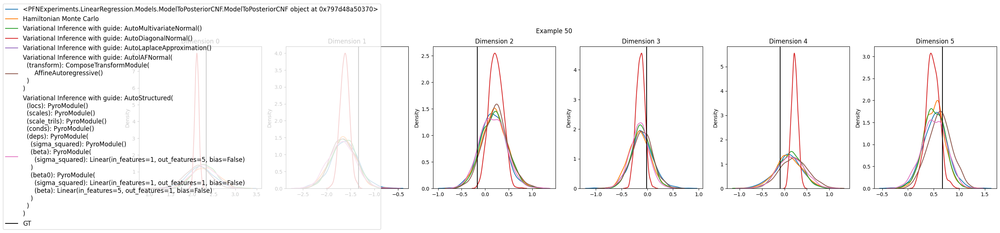

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

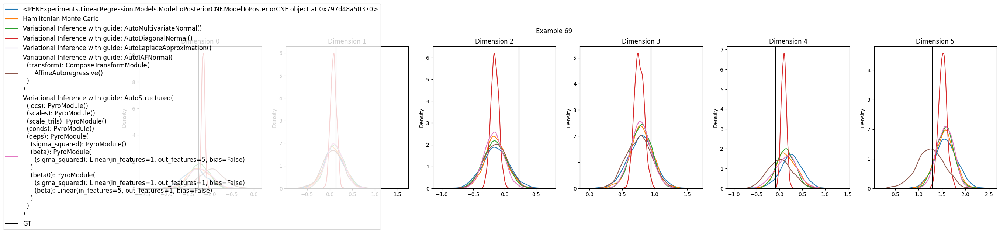

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

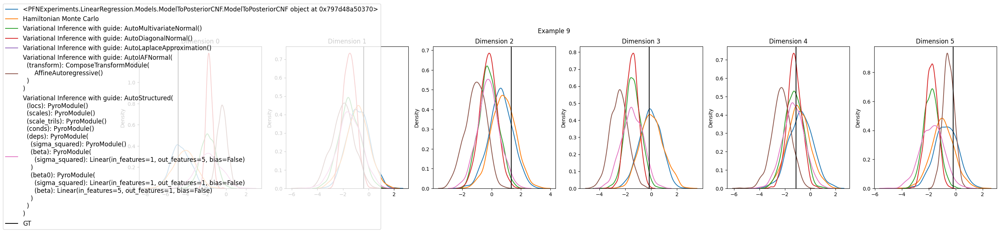

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

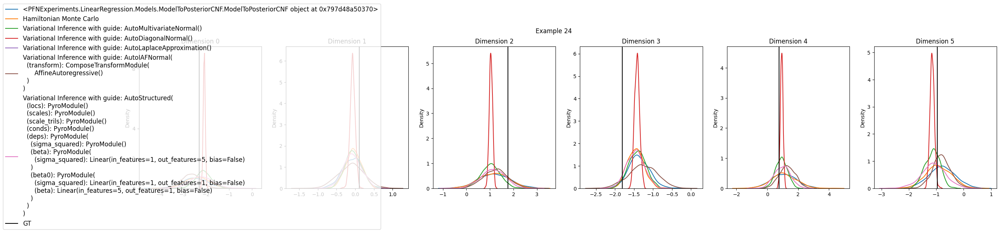

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

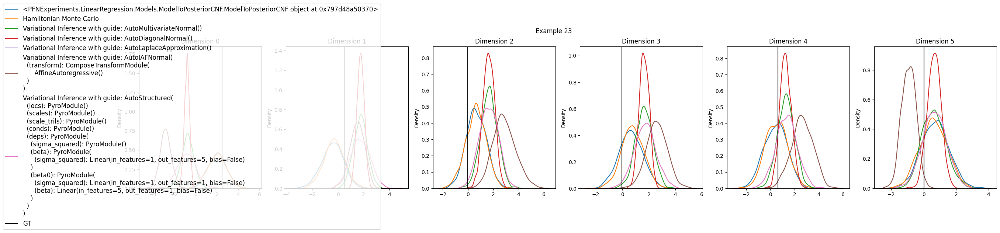

In [73]:
evaluation.plot_results()